In [7]:
# Import libraries
import os
import pandas as pd
import fitz 
from PIL import Image, ImageDraw, ImageEnhance
import layoutparser as lp
import numpy as np
import re

import cv2
import matplotlib.pyplot as plt
%matplotlib inline

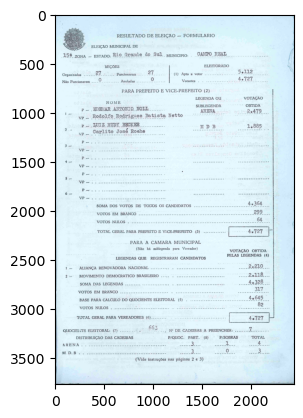

In [68]:
image_path = 'Pictures_1972/1972campo-real.pdf_page_1.png'
image = cv2.imread(image_path)
plt.imshow(image)

In [69]:
#fix contrast to make image clearer
image = cv2.convertScaleAbs(image, alpha = 1.3)

In [28]:
cv2.imshow('img', image)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1) 

-1

## Google Cloud Vision OCR

In [12]:
#Initialize GCV
ocr_agent2 = lp.GCVAgent.with_credential("active-future-256117-e002fc8dd806.json", 
                                        languages = ['por'])

In [70]:
#Run on image
res = ocr_agent2.detect(image, return_response=True)

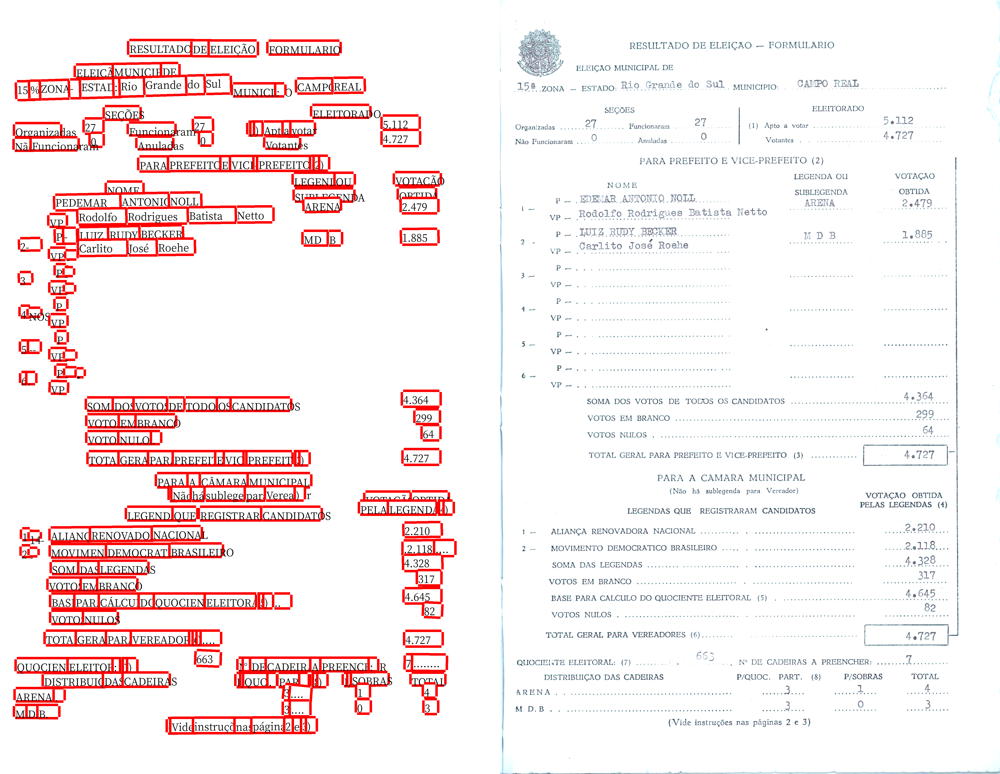

In [71]:
 # collect all the layout elements at the `WORD` level
text = ocr_agent2.gather_full_text_annotation(res, agg_level=lp.GCVFeatureType.WORD)
#Visualize OCR
lp.draw_text(image, text, font_size=50, with_box_on_text=True,
             text_box_width=25)

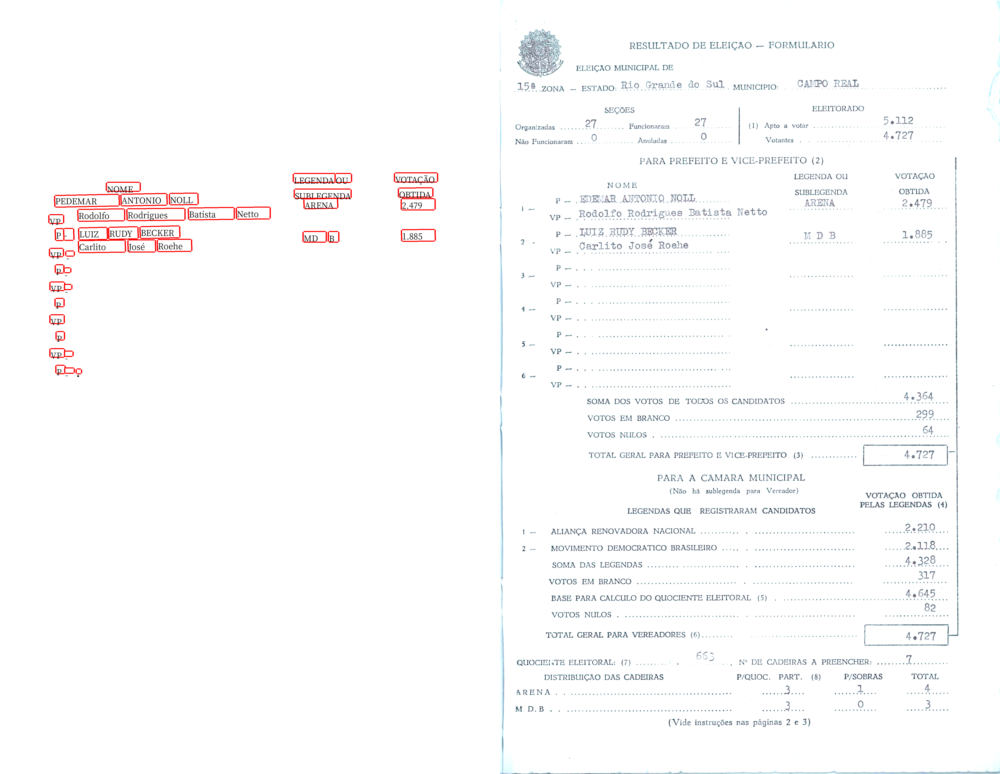

In [72]:
#get text
filtered_text = text.filter_by(lp.Rectangle(x_1=200, y_1=800, x_2=2450, y_2=1880))

#visualise
lp.draw_text(image, filtered_text, font_size=40, with_box_on_text=True, width = 1)

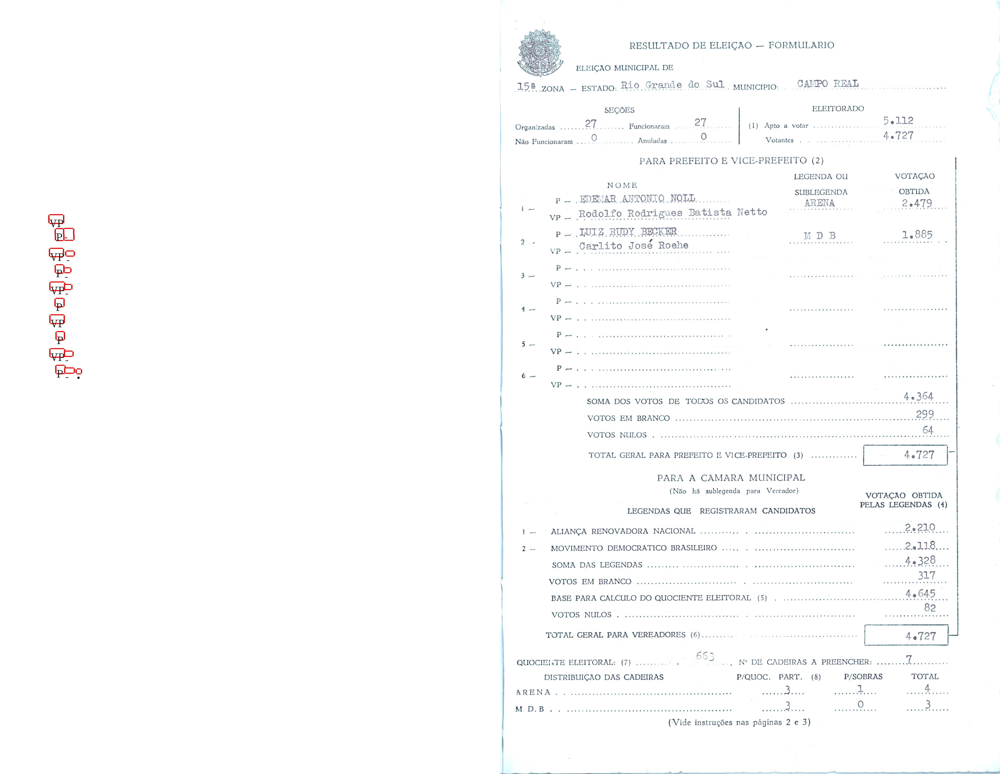

In [73]:
#get positions
position = text.filter_by(
lp.Rectangle(x_1=200, y_1=700, x_2=400, y_2=1880))
#draw text boxes
lp.draw_text(image, position, font_size=50, with_box_on_text=True, width = 25)

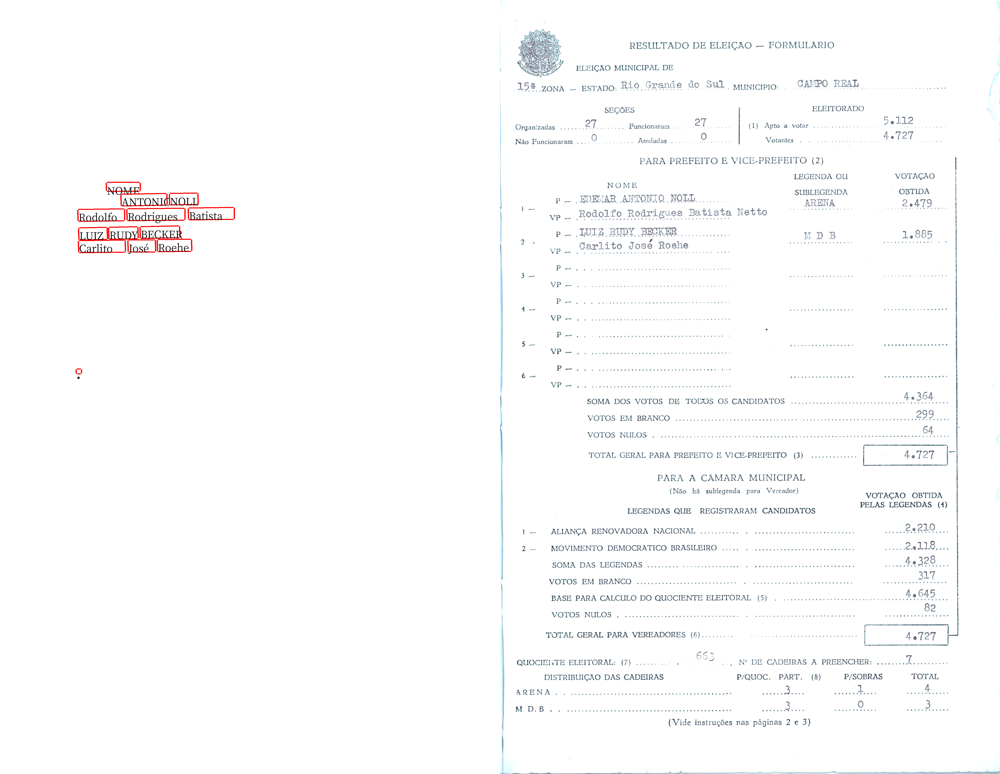

In [82]:
names = text.filter_by(
lp.Rectangle(x_1=350, y_1=800, x_2=1200, y_2=1880))
lp.draw_text(image, names, font_size=50, with_box_on_text=True, width = 25)

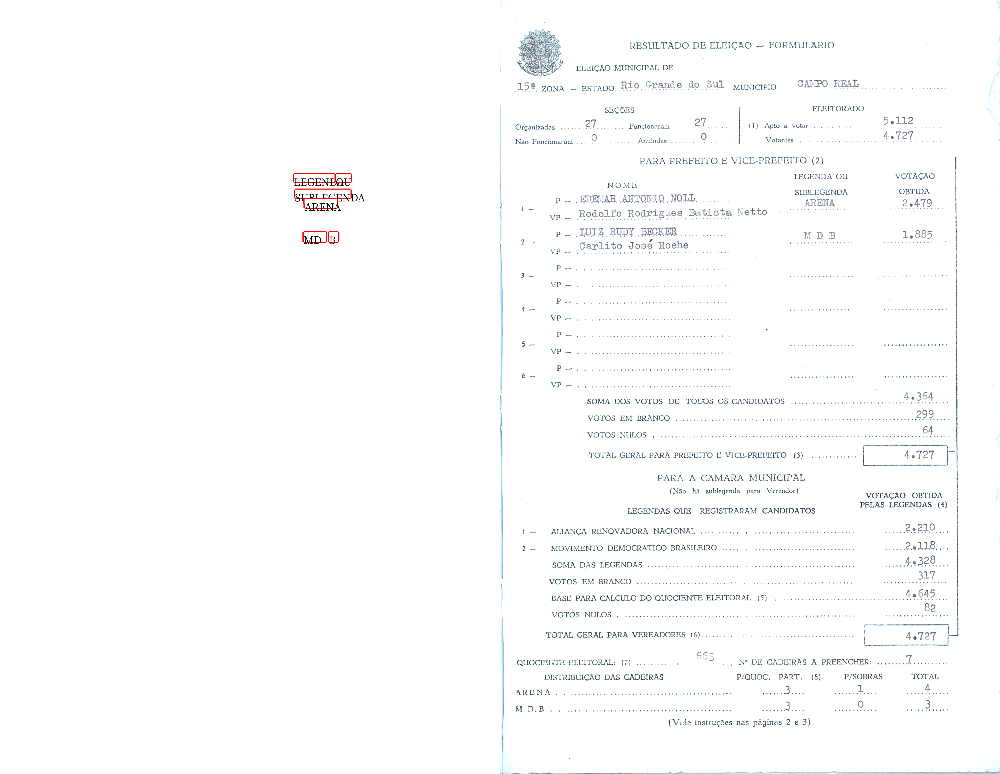

In [74]:
party = text.filter_by(
lp.Rectangle(x_1=1300, y_1=800, x_2=1750, y_2=1850))
lp.draw_text(image, party, font_size=50, with_box_on_text=True, width = 25)

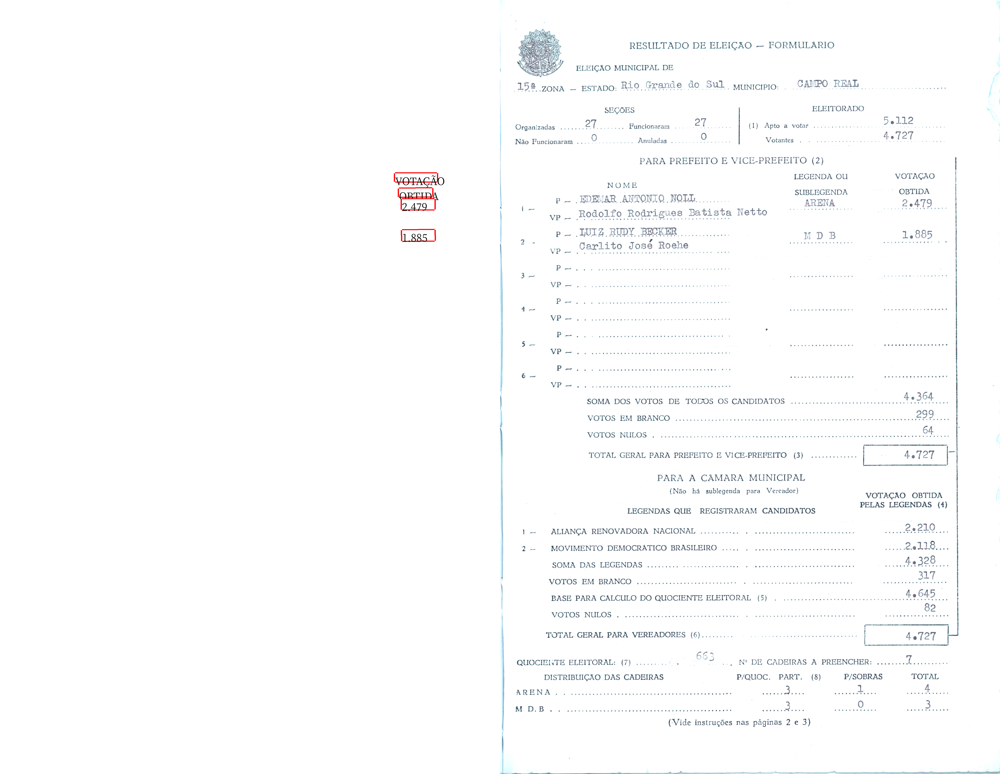

In [75]:
nums = text.filter_by(
lp.Rectangle(x_1=1850, y_1=800, x_2=2450, y_2=1850))

lp.draw_text(image, nums, font_size=50, with_box_on_text=True, width = 25)

## Cleaning and Convert to DF

In [20]:
# create function to group text within each column
def group_blocks_by_distance(blocks, distance_th):
    # Sort the blocks vertically from top to bottom: blocks = sorted(blocks, key = lambda x: x.coordinates[1])
    # Calculate the distances:
    # y coord for the upper edge of the bottom block -
    # y coord for the bottom edge of the upper block
    distances = np.array([b2.coordinates[1] - b1.coordinates[3] for (b1, b2) in zip(blocks, blocks[1:])])
    
    # Append a placeholder for the first word
    distances = np.append([0], distances)
    # Create a block_group based on the distance threshold
    block_group = (distances>distance_th).cumsum()
    grouped_blocks = [lp.Layout([]) for i in range(max(block_group)+1)]
    
    for i, block in zip(block_group, blocks):
        grouped_blocks[i].append(block)
    return grouped_blocks

In [83]:
# group text within first two columns
A = group_blocks_by_distance(position, 0)
B = group_blocks_by_distance(names, 0)
# group rows between columns by aligning y coordinates
height_th = 50
idxA, idxB = 0, 0
result1 = []
while idxA < len(A) and idxB < len(B):
    ay = A[idxA][0].coordinates[1]
    by = B[idxB][0].coordinates[1]
    ares, bres = ' '.join(A[idxA].get_texts()), ' '.join(B[idxB].get_texts())
    if abs(ay - by) < height_th:
        idxA += 1; idxB += 1
    elif ay < by:
        idxA += 1; bres = ''
    else:
        idxB += 1; ares = ''
    result1.append([ares, bres])
    
result1

[['', 'NOME'],
 ['', 'ANTONIO NOLL'],
 ['VP', 'Rodolfo Rodrigues Batista'],
 ['P -', 'LUIZ RUDY BECKER'],
 ['VP -', 'Carlito José Roehe'],
 ['P', ''],
 ['VP', ''],
 ['P', ''],
 ['VP', ''],
 ['P', ''],
 ['VP', ''],
 ['P -', '•']]

In [84]:
# group text within second 2 columns
C = group_blocks_by_distance(party, 0)[1:]
D = group_blocks_by_distance(nums, 0)[1:]
# group rows between columns by aligning y coordinates
height_th = 50
idxC, idxD = 0, 0
result2 = []
while idxC < len(C) and idxD < len(D):
    cy = C[idxC][0].coordinates[1]
    dy = D[idxD][0].coordinates[1]
    cres, dres = ''.join(C[idxC].get_texts()), ''.join(D[idxD].get_texts())
    if abs(cy - dy) < height_th:
        idxC += 1; idxD += 1
    elif cy < dy:
        idxC += 1; dres = ''
    else:
        idxD += 1; cres = ''
    result2.append([cres, dres])
    
result2

[['SUBLEGENDA', 'OBTIDA'], ['ARENA', '2.479'], ['MDB', '1.885']]

In [85]:
#adjust second result to follow format of position and names
result2_adj = [result2[0]] + [item for sublist in result2[1:] for item in [sublist, sublist]]
result2_adj


[['SUBLEGENDA', 'OBTIDA'],
 ['ARENA', '2.479'],
 ['ARENA', '2.479'],
 ['MDB', '1.885'],
 ['MDB', '1.885']]

In [86]:
#combine results
combined = [r1 + r2 for r1, r2 in zip(result1, result2_adj)]
combined

[['', 'NOME', 'SUBLEGENDA', 'OBTIDA'],
 ['', 'ANTONIO NOLL', 'ARENA', '2.479'],
 ['VP', 'Rodolfo Rodrigues Batista', 'ARENA', '2.479'],
 ['P -', 'LUIZ RUDY BECKER', 'MDB', '1.885'],
 ['VP -', 'Carlito José Roehe', 'MDB', '1.885']]

In [88]:
# Convert to dataframe
if len(combined[1:]) > 0:
    df = pd.DataFrame(combined[1:], columns=["position", "name", "party", "votes"])
    df['flag'] = 0
else:
    df = pd.DataFrame(columns=["position", "name", "party", "votes", "flag"])
    df.loc[0] = ['', '', '', '', 1]
    
# Add municipality column
municipality = re.findall(r'/\d+(.+)\.pdf', image_path)
if municipality:
    df['municipality'] = municipality[0]
else:
    df['municipality'] = ''

# Add year column
year = re.findall(r'/(\d+)', image_path)
if year:
    df['year'] = year[0]
else:
    df['year'] = ''
df

,position,name,party,votes,flag,municipality,year
0,,ANTONIO NOLL,ARENA,2.479,0,campo-real,1972
1,VP,Rodolfo Rodrigues Batista,ARENA,2.479,0,campo-real,1972
2,P -,LUIZ RUDY BECKER,MDB,1.885,0,campo-real,1972
3,VP -,Carlito José Roehe,MDB,1.885,0,campo-real,1972
